# CLIP
#### CLIP (Contrastive Language-Image Pre-Training) is a deep learning model developed by OpenAI that learns to associate images and text in a way that can be used for a variety of downstream tasks such as image and text classification, image captioning, and visual question answering.(https://arxiv.org/abs/2103.00020)

#### The model is trained on a large dataset of images and their corresponding captions, and is designed to map both images and text into a common feature space, where similarities between the two can be measured. This allows CLIP to perform tasks such as identifying objects in images based on their textual descriptions, or generating captions for images based on their visual features.

#### CLIP has a wide range of potential use cases, including:

#### Image and text classification and search engine: CLIP can be used to classify images based on their textual descriptions, or to classify text based on the images it describes.

#### Image captioning: CLIP can be used to generate captions for images based on their visual features, without the need for additional training on language modeling.

#### Visual question answering: CLIP can be used to answer questions about images based on their visual features and textual descriptions.

#### Natural language processing: CLIP can be used to encode natural language text into a common feature space, allowing for more accurate text classification and other NLP tasks.



# The Unsplash Dataset
#### for this project and for the search engine we used Unsplash dataset.The Unsplash Dataset is made up of over 250,000+ contributing global photographers and data sourced from hundreds of millions of searches across a nearly unlimited number of uses and contexts. Due to the breadth of intent and semantics contained within the Unsplash dataset, it enables new opportunities for research and learning.

#### The Unsplash Dataset is offered in two datasets:

#### the Lite dataset: available for commercial and noncommercial usage, containing 25k nature-themed Unsplash photos, 25k keywords, and 1M searches
#### the Full dataset: available for noncommercial usage, containing 3M+ high-quality Unsplash photos, 5M keywords, and over 250M searches.
#### We used the Lite version.(https://github.com/unsplash/datasets)



In [1]:
import cv2
import pandas as pd
import torch
import numpy as np
import requests
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
# Load the TSV file into a DataFrame
df = pd.read_csv('/kaggle/input/unsplash/photos.tsv000', sep='\t')
df.head()


,photo_id,photo_url,photo_image_url,photo_submitted_at,photo_featured,photo_width,photo_height,photo_aspect_ratio,photo_description,photographer_username,...,photo_location_country,photo_location_city,stats_views,stats_downloads,ai_description,ai_primary_landmark_name,ai_primary_landmark_latitude,ai_primary_landmark_longitude,ai_primary_landmark_confidence,blur_hash
0,XMyPniM9LF0,https://unsplash.com/photos/XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,2014-09-29 00:08:38.594364,t,4272,2848,1.50,Woman exploring a forest,michellespencer77,...,NaN,NaN,2375421,6967,woman walking in the middle of forest,NaN,NaN,NaN,NaN,L56bVcRRIWMh.gVunlS4SMbsRRxr
1,rDLBArZUl1c,https://unsplash.com/photos/rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,2014-11-18 19:36:57.08945,t,3000,4000,0.75,Succulents in a terrarium,ugmonk,...,NaN,NaN,13784815,82141,succulent plants in clear glass terrarium,NaN,NaN,NaN,NaN,LvI$4txu%2s:_4t6WUj]xat7RPoe
2,cNDGZ2sQ3Bo,https://unsplash.com/photos/cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,2015-01-01 20:02:02.097036,t,2564,1710,1.50,Rural winter mountainside,johnprice,...,NaN,NaN,1302461,3428,rocky mountain under gray sky at daytime,NaN,NaN,NaN,NaN,LhMj%NxvM{t7_4t7aeoM%2M{ozj[
3,iuZ_D1eoq9k,https://unsplash.com/photos/iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,2014-11-01 20:15:13.410073,t,2912,4368,0.67,Poppy seeds and flowers,krisatomic,...,NaN,NaN,2890238,33704,red common poppy flower selective focus phography,NaN,NaN,NaN,NaN,LSC7DirZAsX7}Br@GEWWmnoLWCnj
4,BeD3vjQ8SI0,https://unsplash.com/photos/BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,2014-11-26 13:13:50.134383,t,4896,3264,1.50,Silhouette near dark trees,jonaseriksson,...,NaN,NaN,8704860,49662,trees during night time,NaN,NaN,NaN,NaN,L25|_:V@0hxtI=W;odae0ht6=^NG


In [3]:
df=df[['photo_id','photo_image_url','photo_description']]
df.head()

,photo_id,photo_image_url,photo_description
0,XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,Woman exploring a forest
1,rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,Succulents in a terrarium
2,cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,Rural winter mountainside
3,iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,Poppy seeds and flowers
4,BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,Silhouette near dark trees


# Methodology:
#### we plan to feed 25K images to the dataset.create embeddings and extract features of each image and then the user can insert a query and get related images to their text query.

#### we also fed a video to our model and captured frames of it and then searched for desired queries such as sky,cars and sea and got the related frames in the output.


# Model:
#### we used sentence-transformers/clip-ViT-B-32 from hugging Face.This is the Image & Text model CLIP, which maps text and images to a shared vector space. The  the usage of this model is easy as shown below:
from sentence_transformers import SentenceTransformer, util
from PIL import Image

#Load CLIP model

model = SentenceTransformer('clip-ViT-B-32')

#Encode an image:

img_emb = model.encode(Image.open('two_dogs_in_snow.jpg'))

#Encode text descriptions

text_emb = model.encode(['Two dogs in the snow', 'A cat on a table', 'A picture of London at night'])

#Compute cosine similarities 

cos_scores = util.cos_sim(img_emb, text_emb)
print(cos_scores)

#### SentenceTransformers provides models that allow to embed images and text into the same vector space. This allows to find similar images as well as to implement image search.

In [4]:
!pip install sentence_transformers transformers
from sentence_transformers import SentenceTransformer
model1 = SentenceTransformer('clip-ViT-B-32')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for sentence_transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=87499023c0abdb4ee19875e4b65b6808c22ca55cf7ec05eb2af087f94216a243
  Stored in directory: /root/.cache/pip/wheels/83/71/2b/40d17d21937fed496fb99145227eca8f20b4891240ff60c86f
Successfully built sentence_transformers


In [7]:
model1.to(device)

SentenceTransformer(
  (0): CLIPModel()
)

#### One of the issues with this dataset was that some image urls were faulthy and resulted in a lot of errors.
#### Creating embeddings for the images:

In [ ]:
import requests
from PIL import Image
from io import BytesIO
import torch
url_list=df['photo_image_url'].tolist()
# Define a list to store the indices of the faulty URLs
faulty_indices = []

img_embeddings = []

for i, url in enumerate(url_list[:15000]):
    try:
        response = requests.get(url)
        image = Image.open(BytesIO(response.content))
        image_em = model1.encode(image,show_progress_bar=False)
        img_embeddings.append(image_em)
        if (i+1) % 1000== 0:
            print("Processed {} samples".format(i+1))
    except:
        # If there was an error processing the URL, append the index to the faulty_indices list
        faulty_indices.append(i)

        continue


Processed 1000 samples


In [8]:
len(img_embeddings)

499

In [9]:
faulty_indices

[163]

In [22]:
#img_embeddings
import numpy as np
image_embeddings = np.array(img_embeddings)

# Save the array to a .npy file
np.save('image_features1.npy', image_embeddings)

In [10]:
df2=df.head(500)
df2=df2.drop(labels=faulty_indices ,axis=0)
df2 = df2.reset_index()
df2['img_embeddings']=img_embeddings
#df2.to_csv('df_with_embeddings.csv')

In [11]:
df2.head()

,index,photo_id,photo_image_url,photo_description,img_embeddings
0,0,XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,Woman exploring a forest,"[-0.28357166, 0.6603953, 0.15704419, 0.1067858..."
1,1,rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,Succulents in a terrarium,"[-0.48558712, 0.41402024, -0.121365234, 0.1435..."
2,2,cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,Rural winter mountainside,"[-0.31590873, 0.6827722, 0.04307574, 0.2806446..."
3,3,iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,Poppy seeds and flowers,"[0.0051131845, 0.17519622, -0.23967189, -0.345..."
4,4,BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,Silhouette near dark trees,"[-0.2817433, 0.017431736, -0.17361663, 0.06159..."


In [12]:
def cosine_sim(a,b):
    dot_product = np.dot(a, b)

    # compute magnitudes
    magnitude_a = np.sqrt(np.dot(a, a))
    magnitude_b = np.sqrt(np.dot(b, b))

    # compute cosine similarity
    cos_sim = dot_product / (magnitude_a * magnitude_b)
    return cos_sim

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

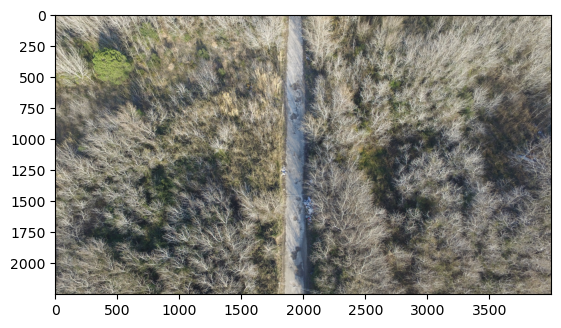

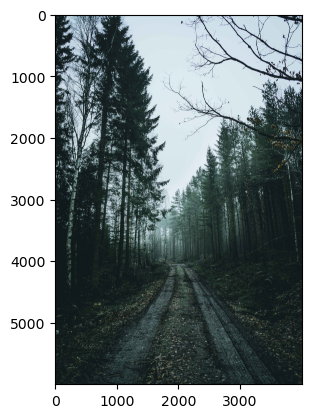

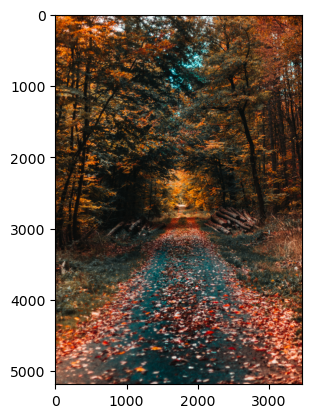

In [17]:
example_query=np.array(model1.encode("roads inside the woods", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()
    

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

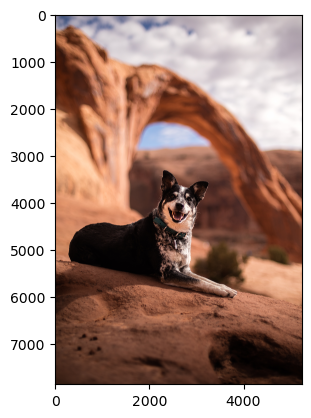

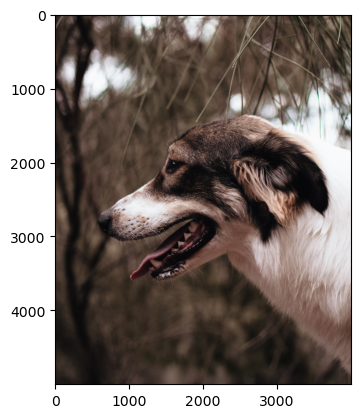

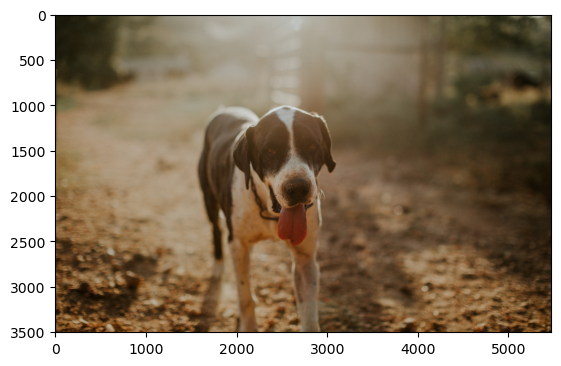

In [18]:
example_query=np.array(model1.encode("dogs in nature", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

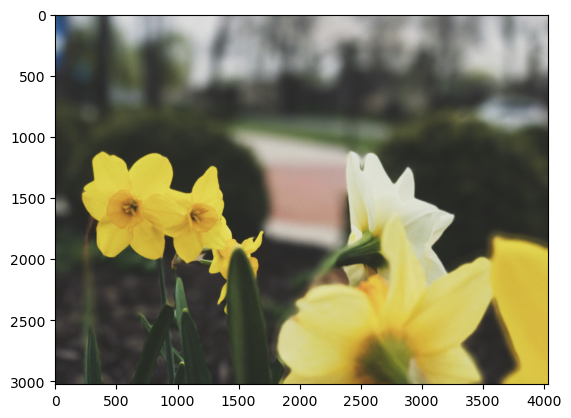

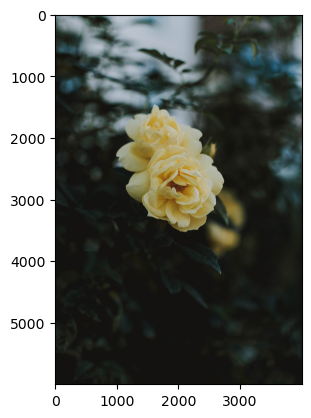

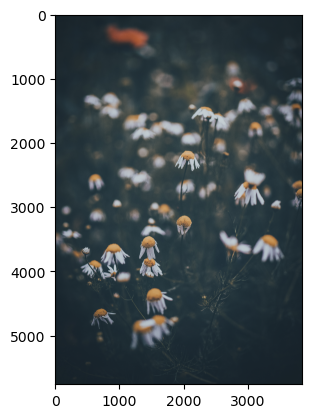

In [19]:
import numpy as np
example_query=np.array(model1.encode("yellow flowers", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

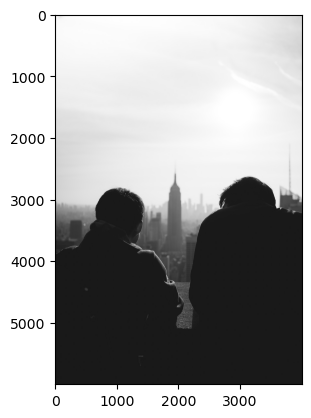

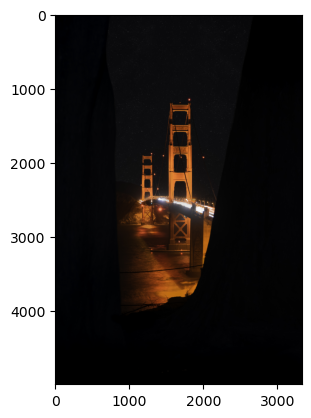

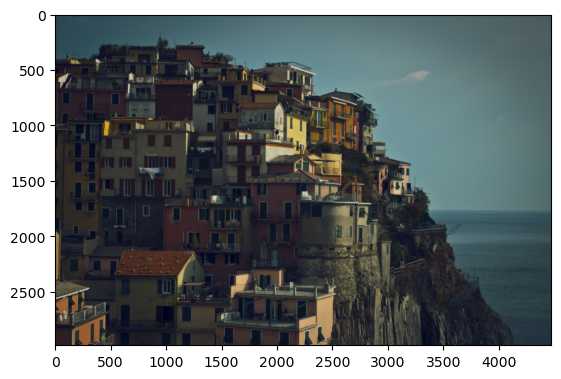

In [21]:
example_query=np.array(model1.encode("city life", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

# Image-to-Image Search
#### the user inserts a photo and can see similar photos in the output.

#### inspiration: 

https://github.com/UKPLab/sentence-transformers/blob/master/examples/applications/image-search/Image_Search.ipynb

In [22]:
sample_image1= Image.open("/kaggle/input/sampleinput/alice-triquet-HeEJU3nrg_0-unsplash.jpg")
sample_image2= Image.open("/kaggle/input/sampleinput/jerry-zhang-SJGiS1JzUCc-unsplash.jpg")
sample_image3= Image.open("/kaggle/input/sampleinput/keith-tanner-f-U6iHYUzO8-unsplash.jpg")

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


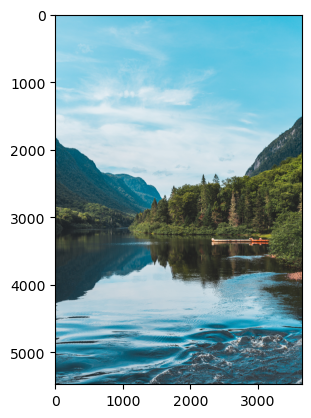

similar images by CLIP:


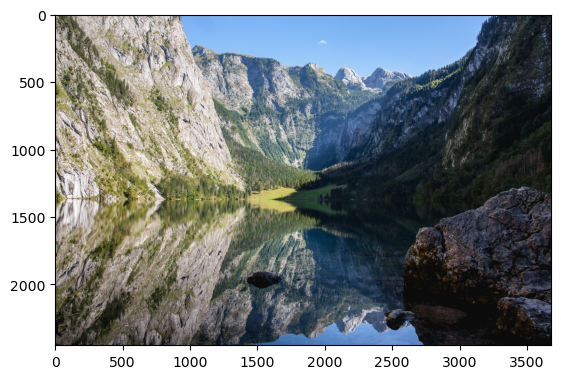

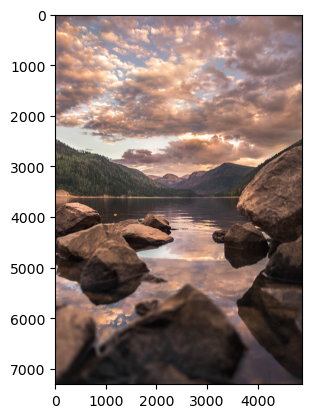

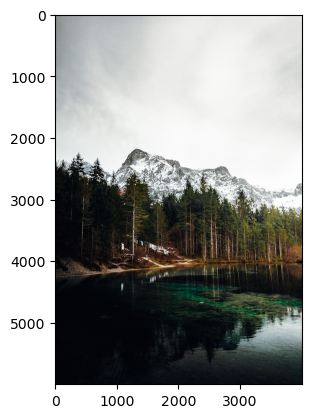

In [23]:
sample_image_1_embed=np.array(model1.encode(sample_image1, show_progress_bar=True))
cosine_sims = [cosine_sim(sample_image_1_embed,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image1)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


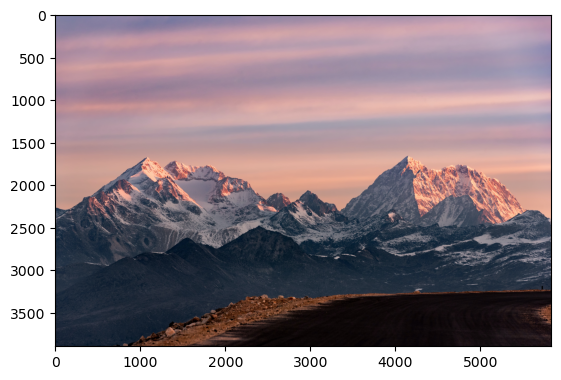

similar images by CLIP:


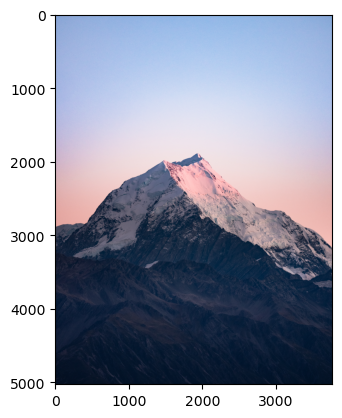

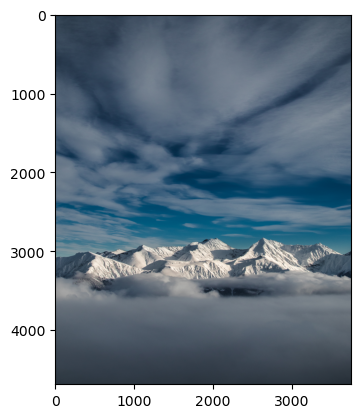

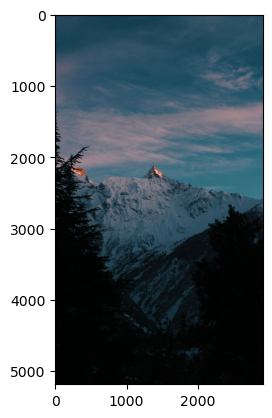

In [24]:
sample_image_1_embed=np.array(model1.encode(sample_image2, show_progress_bar=True))
cosine_sims = [cosine_sim(sample_image_1_embed,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image2)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


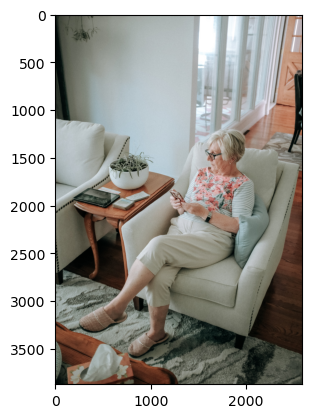

similar images by CLIP:


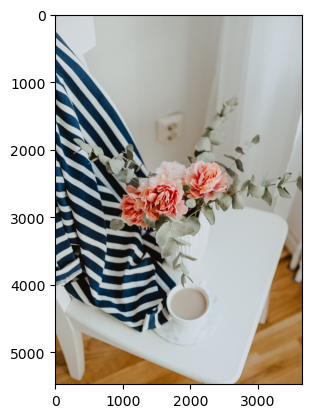

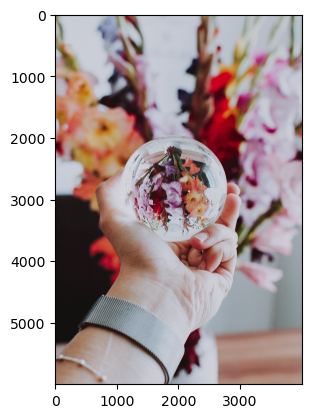

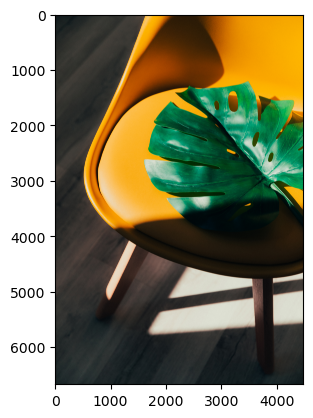

In [25]:
sample_image_1_embed=np.array(model1.encode(sample_image3, show_progress_bar=True))
cosine_sims = [cosine_sim(sample_image_1_embed,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image3)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

# Combining Image and Text:
#### here we feed the model with two inputs, one text and one image and the output will be an image, combination of two inputs.
#### The idea here is to do a text search for a photo and then modify the search query by adding another photo to the search query in order to transfer some of the photo features to the search.

#### This works by adding the features of the photo to the features of the text query. The photo features are multiplied with a weight in order to reduce the influence so that the text query is the main source.

#### The results are somewhat sensitive to the prompt...
#### inspiration: https://github.com/haltakov/natural-language-image-search

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


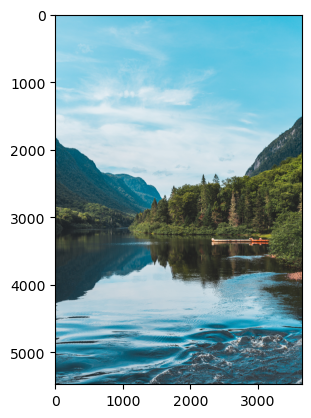

similar images by CLIP:


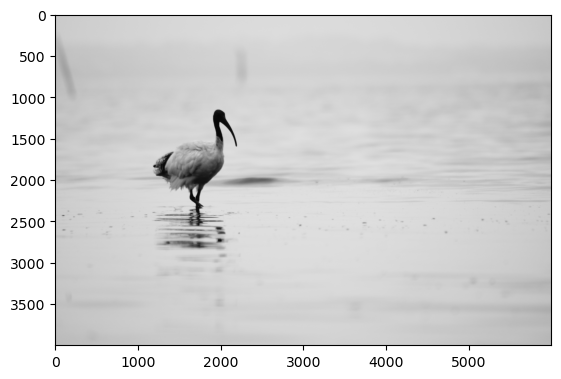

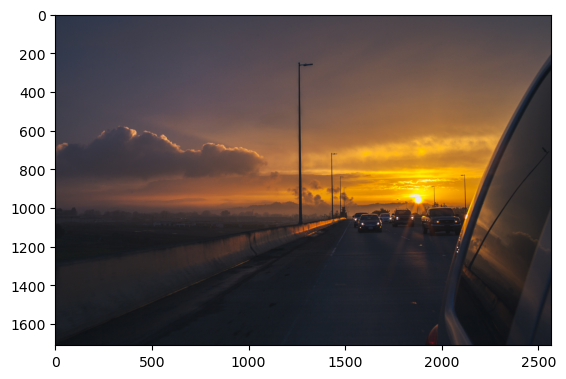

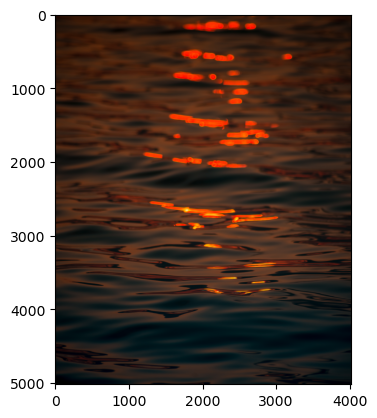

In [31]:
query='night in the city'
sample_image1= Image.open("/kaggle/input/sampleinput/alice-triquet-HeEJU3nrg_0-unsplash.jpg")
sample_image_1_embed=np.array(model1.encode(sample_image1, show_progress_bar=True))
example_query_embed=np.array(model1.encode("dark night", show_progress_bar=True))
result=example_query_embed+sample_image_1_embed
arr_normalized = (result - np.min(result)) / (np.max(result) - np.min(result))

#arr_normalized = result / normalized_arr

cosine_sims = [cosine_sim(arr_normalized,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image1)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


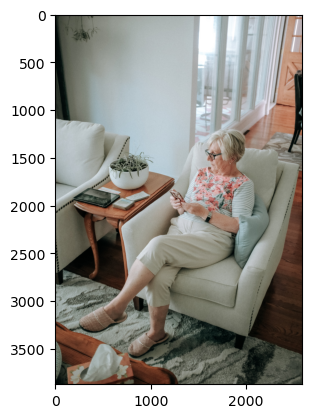

similar images by CLIP:


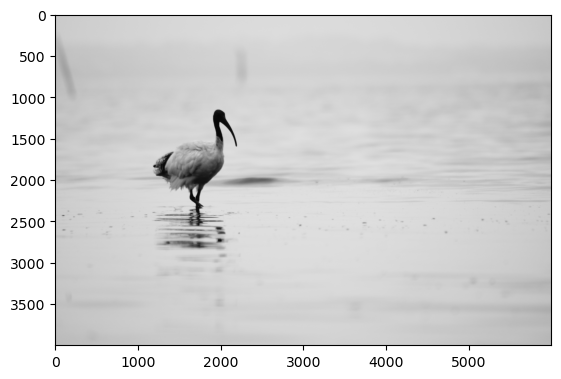

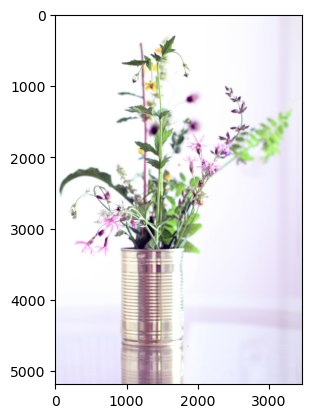

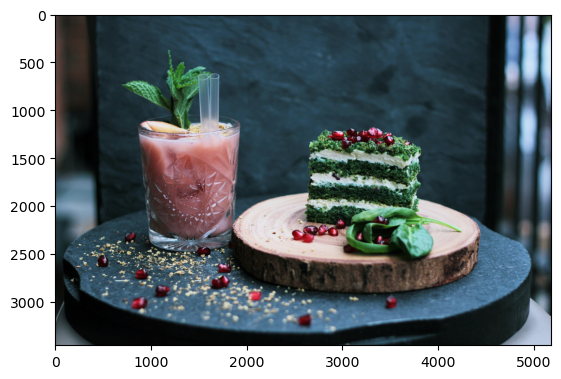

In [34]:
query='Woman in the woods'

sample_image_3_embed=np.array(model1.encode(sample_image3, show_progress_bar=True))
example_query_embed=np.array(model1.encode("Woman in the woods", show_progress_bar=True))
result=example_query_embed+sample_image_3_embed
arr_normalized = (result - np.min(result)) / (np.max(result) - np.min(result))

#arr_normalized = result / normalized_arr

cosine_sims = [cosine_sim(arr_normalized,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image3)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()


# Video Search Engine:

#### Video search engine using the Contrastive Language-Image Pre-Training (CLIP) model from Hugging Face would work by leveraging the model's ability to understand the semantic meaning of both images and text. CLIP is a  state-of-the-art model that can be used for a variety of tasks, including image and text search.This would  make it easier for users to find the videos they are looking for, even if they don't use exact keywords or phrases.

#### Here's the procedure of how a video search engine using CLIP:

#### first, user enters a search query into the search box of the video search engine, such as "dogs playing in the park."
#### The search engine uses the CLIP model to analyze both the text and visual content of videos in its database that match the search query.
#### The CLIP model generates a vector representation for each video based on its semantic meaning and visual content.
#### The search engine compares the vector representation of each video to the user's query, ranking the videos by similarity.
#### The search engine displays a list of video frames that match the search query.
#### inspiration: https://www.storminthecastle.com/posts/video_search/


## Inserting a sample video:
#### here we chose a small video about Positano, Italy.
#### The video Can be found in this link:
#### https://drive.google.com/file/d/1ZWJJuH6WdH5y56mZClCfcoF-lMPM8k9k/view

#### We'll be using the python OpenCV module to process our video. OpenCV makes it pretty easy to load and decode video frames. But one small annoyance with OpenCV is that it tends to work with pixel data in the BGR pixel format. The CLIP model has been trained on images in the RGB pixel format and is the more common convention. So we'll need to convert any pixel data that we obtain from OpenCV to RGB. OpenCV does have a function for converting between the pixel formats called cvtColor

In [54]:
cap = cv2.VideoCapture('/kaggle/input/positano/positano.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES, 500)
ret, frame = cap.read()
frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)

In [59]:
url = 'https://drive.google.com/file/d/1ZWJJuH6WdH5y56mZClCfcoF-lMPM8k9k/view'
from IPython.display import HTML
HTML(f"""<video src={url} autoplay loop width=600 controls/>""")

#### Here we choose one frame in each second.

#### video_duration function is gives the duration of our video in seconds
#### video_frame returns the frame for a particular second of the video.

In [252]:
def video_duration(path):
  video = cv2.VideoCapture(path)
  fps = video.get(cv2.CAP_PROP_FPS)
  frame_count = video.get(cv2.CAP_PROP_FRAME_COUNT)
  return frame_count/fps

a=video_duration('/kaggle/input/positano/positano.mp4')

In [255]:
def video_frame(path,timestamp):
  video = cv2.VideoCapture(path)
  fps = video.get(cv2.CAP_PROP_FPS)
  video.set(cv2.CAP_PROP_POS_MSEC, timestamp * 1000)
  ret,frame = video.read()
  frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
  return frame if ret else None

#### Like before, we start with creating embeddings of each second of the video and saving them in video_embeddings list and then calculate cosine similarity between a random input query by the user and video_embeddings.

In [260]:
video_embeddings=[]
for i in range(int(a)):
    f=video_frame('/kaggle/input/positano/positano.mp4',i)
    frame_embedding = model1.encode(Image.fromarray(f),show_progress_bar=False, convert_to_tensor=True)
    video_embeddings.append(frame_embedding)

    

#### As it is clear, we have one frame for each second for avoiding repetition

In [261]:
len(video_embeddings)

151

In [266]:
# Get the text embedding
text = "beach"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

55


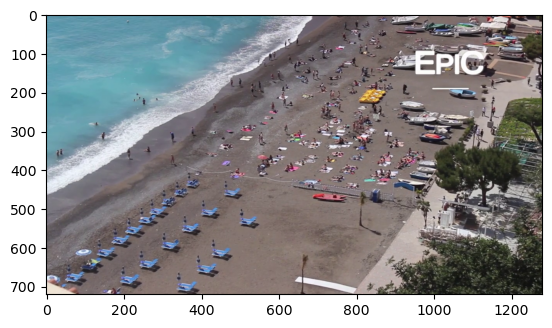

54


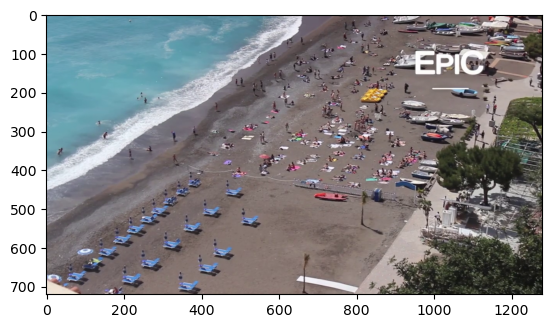

53


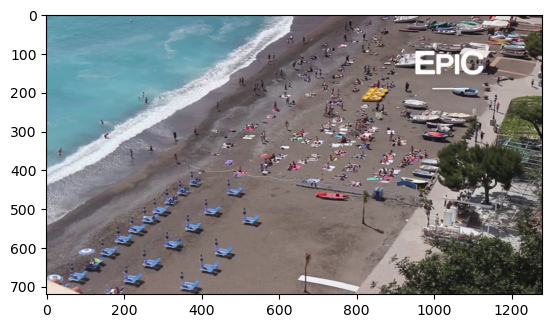

60


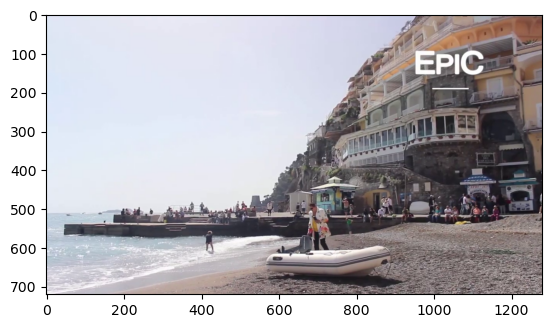

61


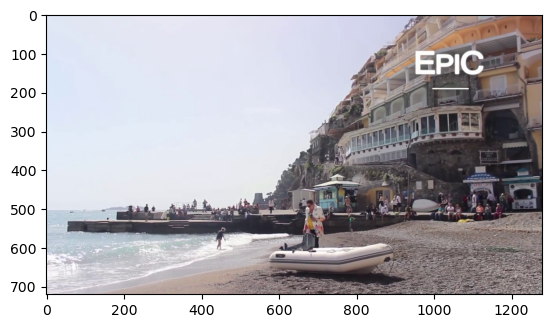

62


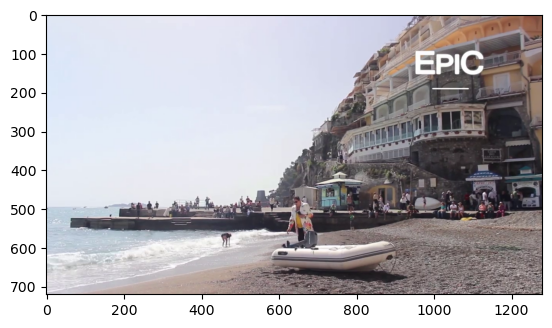

27


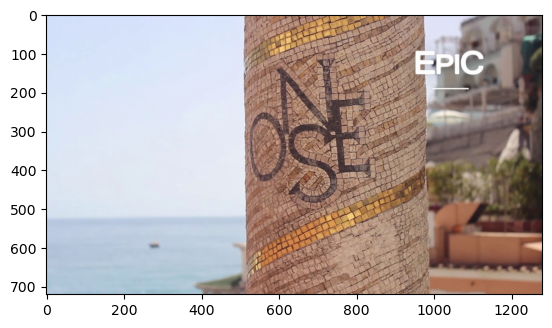

In [270]:
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()
    
    

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

112


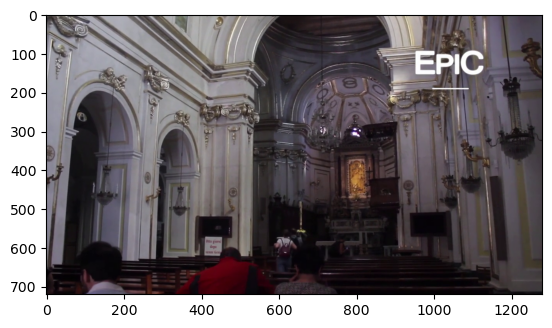

111


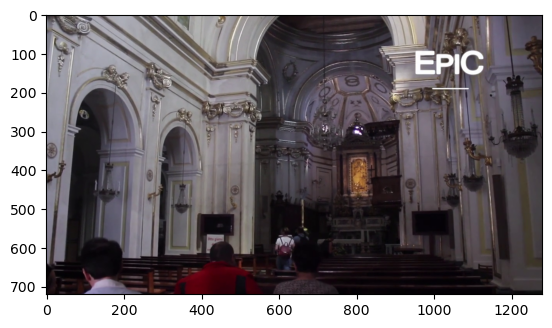

108


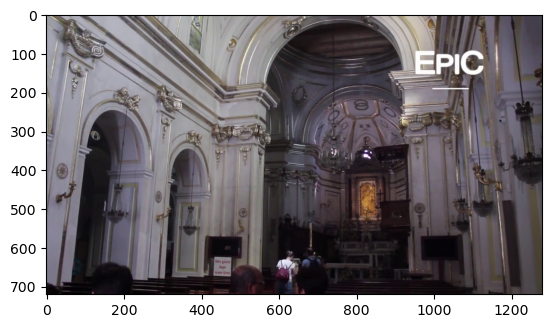

113


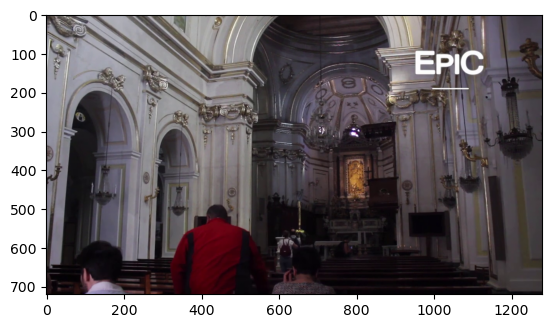

110


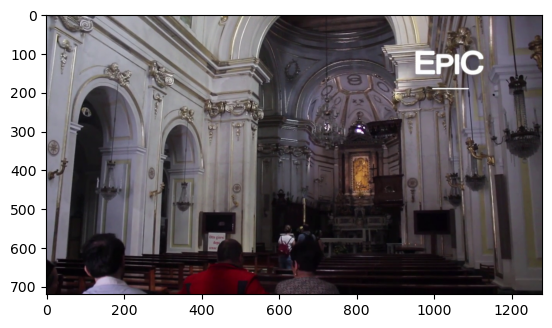

109


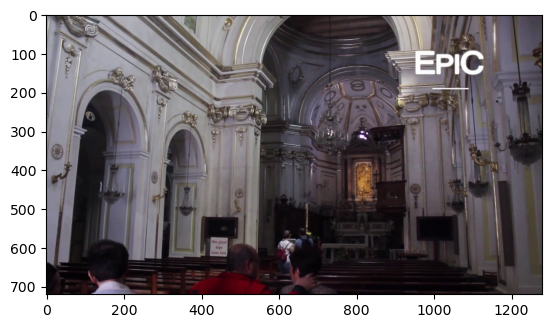

107


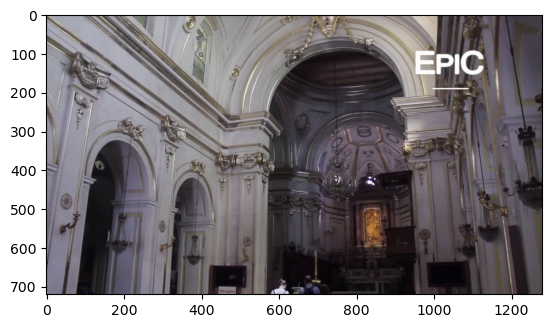

In [273]:
text = "church"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

6


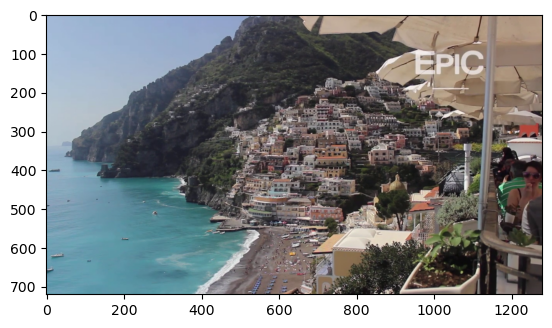

12


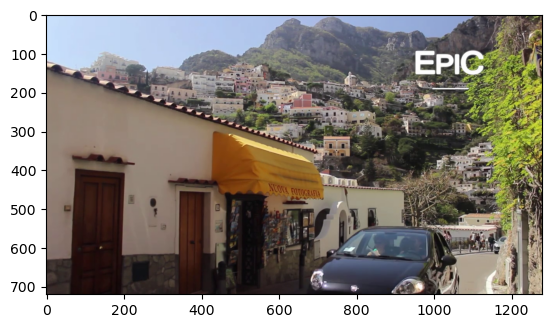

38


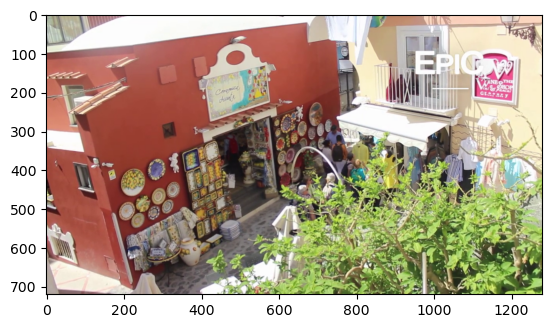

126


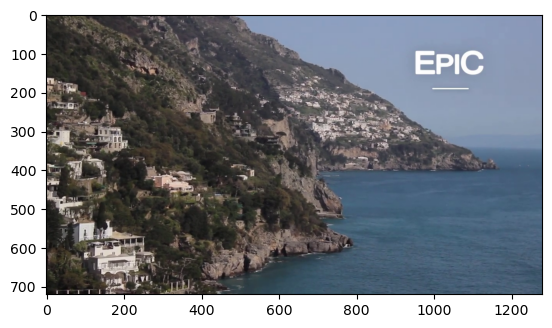

11


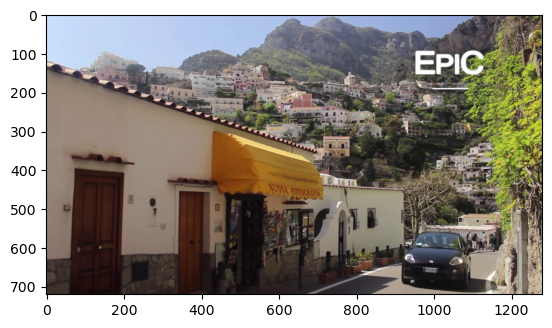

10


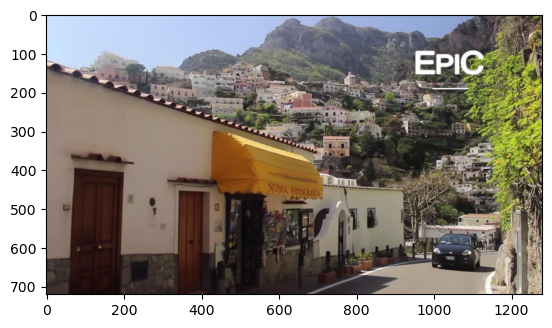

125


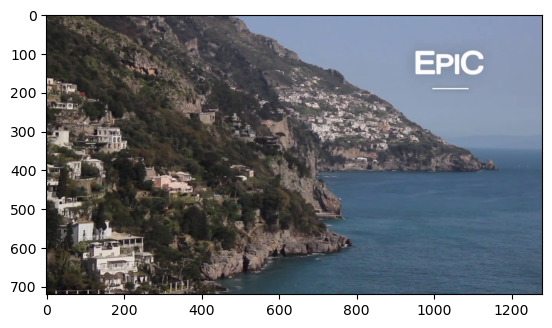

In [274]:
text = "village"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

28


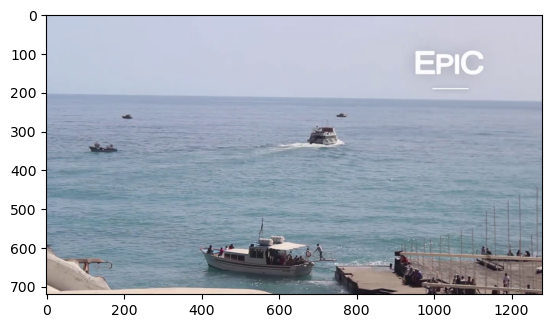

30


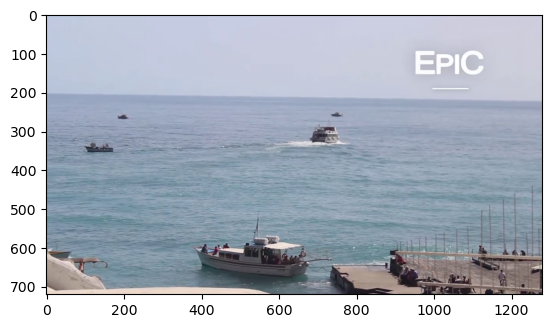

31


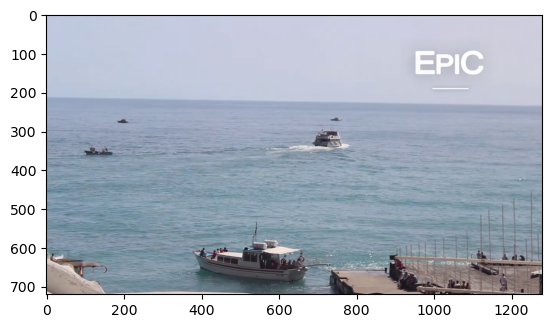

29


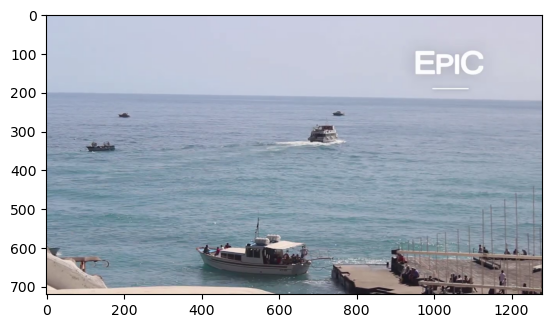

56


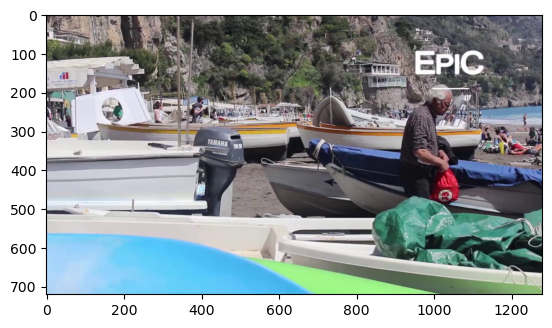

58


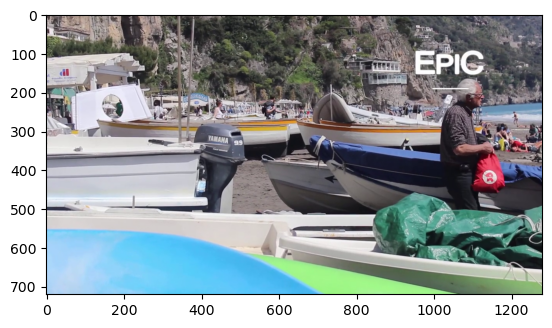

57


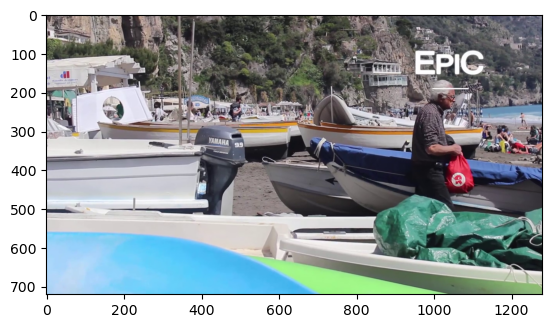

In [275]:
text = "boat"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()


# Future works:
#### 1.Try another model. there are larger models available ('RN50', 'RN101', 'RN50x4', 'RN50x16', 'ViT-B/32', 'ViT-B/16').
#### 2.Use another similarity indicator such as Faiss.Faiss is a library from Facebook for efficient similarity search and clustering of dense vectors. It offers many different functionalities, such as:

#### Basic vector similarity search without any clustering or compression
#### Partitioned index with Voronoi cells to do an approximate search (to speed up the search)
#### Vector compression using product quantization (to reduce the memory footprint)
#### 3.Implement zero-shot classification with CLIP.